____
# Small structures


In [19]:
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib.pyplot as plt

import os
from glob import glob

from swot import add_mask_inside_swot, build_swath_polygon, plot_swot_tracks
from cstes import swot_dir, drifters_dir, zarr_dir, surface_drifters, depth_drifters, depth_100, depth_50, images_dir, U2, err_acc, drifters_structure, structure
from diagnosis import update_dict, dataset_coloc_combs, dataset_coloc_combs, prepared_drifters, prepared_wd, prepared_alti, compute_variance_groupby, compute_variance
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.geodesic as cgeo
crs = ccrs.PlateCarree()

import cartopy.geodesic as geod
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import pyproj
from pyproj import Geod

from rasterio.transform import Affine

import pynsitu as pyn

from diagnosis import synthetic_figure
from cstes import U2, c0

# Characteritics :

In [20]:
def sel_structure(dfr, cmin, lomin, lamin, cmax, lomax, lamax, pass_, drifter_id):
    #id = dfr[(dfr.longitude>=lomin)&(dfr.longitude<=lomax)&(dfr.latitude>=lamin)&(dfr.latitude<=lamax)&(dfr.cycle_number>=cmin)&(dfr.cycle_number<=cmax)].drifter_id.unique()
    id = drifter_id
    dfr = dfr[((dfr.drifter_id.isin(id))
               &(dfr.longitude>=lomin)
               &(dfr.longitude<=lomax)
               &(dfr.latitude>=lamin)
               &(dfr.latitude<=lamax)
               &(dfr.cycle_number>=cmin)
               &(dfr.cycle_number<=cmax)
               #&(~((dfr.longitude<4.75)&(dfr.latitude<40.6)))
              )]
    return dfr

def generate_0_15m_coloc_dataframe(freq_band):
    
    DT = 12
    
    # SURFACE
    base_dic = dict(dt='12h', 
            drifter_preprocess = 'spectral_decomp',
            drifter_preprocess_param= freq_band,
            alti_product_key='swot2km',
            alti_diff_method = 'fromduacsv',
            alti_diff_method_param = '',
            ggd_var = 'fromduacsv',
            wd_product_key = 'era5', 
            wd_model ='rio', 
            wd_depth = '0')
    
    
    comb_list = [base_dic]
    
    
    ds0 = dataset_coloc_combs(comb_list, nearest =False, remove_id_outliers = True)
    ds0 = ds0.where(ds0.depth==0, drop=True)
    #distance_to_coast = ds0.distance_to_coast.isel(id_comb=0)
    #ds0['distance_to_coast'] = ('row_number', distance_to_coast.values)
    #ds0 = ds0.where(ds0.time_to_swot/pd.Timedelta('1h')<DT, drop=True)
    #ds0 = ds0.where((abs(ds0.ggde)<1e-4) & (abs(ds0.ggdn)<1e-4), drop=True)
    #ds0 = ds0.where(ds0.distance_to_coast>distance_to_coast_max, drop=True)
    
    df0 = ds0.to_dataframe().reset_index().set_index('row_number')
    
    #DEPTH 15M
    base_dic = dict(dt='12h', 
                drifter_preprocess = 'spectral_decomp',
                drifter_preprocess_param=freq_band,
                alti_product_key='swot2km',
                alti_diff_method = 'fromduacsv',
                alti_diff_method_param = '',
                ggd_var = 'fromduacsv',
                wd_product_key = 'era5', 
                wd_model ='rio', 
                wd_depth = '15')
    
    comb_list = [    
        base_dic, 
    ]
    
    ds15 = dataset_coloc_combs(comb_list, nearest =False, remove_id_outliers = True)
    ds15 =ds15.where(ds15.depth==15, drop=True)
    #distance_to_coast = ds15.distance_to_coast.isel(id_comb=0)
    #ds15['distance_to_coast'] = ('row_number', distance_to_coast.values)
    ds15 = ds15.where(ds15.time_to_swot/pd.Timedelta('1h')<DT, drop=True)
    #ds15 = ds15.where((abs(ds15.ggde)<1e-4) & (abs(ds15.ggdn)<1e-4), drop=True)
    #ds15 = ds15.where(ds15.distance_to_coast>distance_to_coast_max, drop=True)
    
    df15 = ds15.to_dataframe().reset_index().set_index('row_number')

    return df0, df15

# SWOT

In [21]:
def swot_dss(cmin, lomin, lamin, cmax, lomax, lamax, pass_, drifter_id):
    product = 'swot2km'
    dss = xr.open_dataset(os.path.join(zarr_dir, 'before_coloc','preprocessed_swot', product, 'general', f'pass{pass_}_{product}_general.nc'))
    dss = xr.merge([dss,  xr.open_dataset(os.path.join(zarr_dir, 'before_coloc','preprocessed_swot', product, 'diff_only', f'pass{pass_}_{product}_diff_only.nc'))], compat='override')
    dss= dss.where(dss.distance_to_coast>20e3, drop=True)
    dss = dss.sel(cycle_number= slice(cmin, cmax+1))
    dss = dss.where((dss.longitude>=lomin)&(dss.longitude<=lomax)&(dss.latitude>=lamin)&(dss.latitude<=lamax), drop=True)
    dss['time'] = (dss.time - np.timedelta64(946684800000000000, 'ns'))
    dss['etaf'] = dss.etaf.assign_attrs({'long_name':'DSL', 'units':'m'})
    return dss

def era_ds(t, lomin, lamin, lomax, lamax):

    era = xr.open_dataset(os.path.join(zarr_dir, 'before_coloc/wind/era5_agesc_rio_z15.nc'))
    era = era.interp(time=t)
    era = era.where((era.longitude>=lomin)&(era.longitude<=lomax)&(era.latitude>=lamin)&(era.latitude<=lamax), drop=True)
    return era
    
def get_structure_datasets(cmin, lomin, lamin, cmax, lomax, lamax, pass_, drifter_id):
    
    dfr = prepared_drifters('12h', drifter_preprocess = 'spectral_decomp', drifter_preprocess_param='inertial')
    #from diagnosis import define_coloc_source
    #colocs_source = define_coloc_source('12h', drifter_preprocess = 'spectral_decomp', drifter_preprocess_param='')
    #dfw = pd.read_parquet(os.path.join(zarr_dir,'coloc_files','wind','era5_rioagesc_12h_spectral_decomp_all_med_variational_10min_v1.parquet'))
    #dfr = pd.concat([dfr, dfw])
    dfr_ = sel_structure(dfr, cmin, lomin, lamin, cmax, lomax, lamax, pass_ , drifter_id)
    depthcolor = {0:'navy', 15:'green', 50:'yellowgreen', 100:'yellow'}
    dfr_['depthcolor'] = [depthcolor[d] for d in dfr_.depth] 
    dfr__ = dfr[dfr.drifter_id.isin(dfr_.drifter_id.unique())]

    #dfw = prepared_wd('12h', drifter_preprocess = 'spectral_decomp', drifter_preprocess_param='', wd_product_key = 'era5', wd_model ='rio')
    #dfw_ = sel_structure(dfw, cmin, lomin, lamin, cmax, lomax, lamax, pass_ , drifter_id)
    dss = swot_dss(cmin, lomin, lamin, cmax, lomax, lamax, pass_, drifter_id)
    era = era_ds(dss.time.mean('num_lines').values, lomin, lamin, lomax, lamax)
    return dfr_, dfr__, dss,era, [lomin, lomax, lamin, lamax]


dfr, dfr_, dss, era,  bbox = get_structure_datasets(**structure['Dipole D1'])#{'cmin':505, 'lomin':4, 'lamin':39.2, 'cmax':517, 'lomax':5.15, 'lamax':40, 'pass_':3})

/dev/shm/pbs.3769585.datarmor0/ipykernel_14843/500685825.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfr_['depthcolor'] = [depthcolor[d] for d in dfr_.depth]


In [26]:
os.path.join(zarr_dir, 'before_coloc/wind/era5_agesc_rio_z15.nc')
            

'/home/datawork-lops-oc/aponte/margot/DATA_MED_COLOC_v2.0.1/before_coloc/wind/era5_agesc_rio_z15.nc'

# Overview

## All on one image

In [4]:
DF = dict()
DS = dict()
for k in structure :
    dfr, dfr_, dss, era, bbox = get_structure_datasets(**structure[k])
    DF[k] = dfr
    DS[k] = dss

/dev/shm/pbs.3769585.datarmor0/ipykernel_14843/500685825.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfr_['depthcolor'] = [depthcolor[d] for d in dfr_.depth]
/dev/shm/pbs.3769585.datarmor0/ipykernel_14843/500685825.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfr_['depthcolor'] = [depthcolor[d] for d in dfr_.depth]
/dev/shm/pbs.3769585.datarmor0/ipykernel_14843/500685825.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

In [5]:
from cstes import drifters_dir
ds = xr.open_dataset(os.path.join(drifters_dir,'L2', 'L2_all_med_variational_1h_v1.nc'))
ds =ds.where(ds.gap_mask==1).where(ds.datetime<pd.to_datetime('2023-07-15T00:00:00.000000000'), drop=True)

In [ ]:
depthcolor = {0:'navy', 15:'green', 50:'yellowgreen', 100:'yellow'}
fig, ax = plt.subplots(figsize=(0.1, 0.1))
a = np.arange(0, 10)
for d in depthcolor : 
    ax.plot(a,a, label = f'z={d}m', color = depthcolor[d])
h, l = ax.get_legend_handles_labels()

NameError: name 'h' is not defined

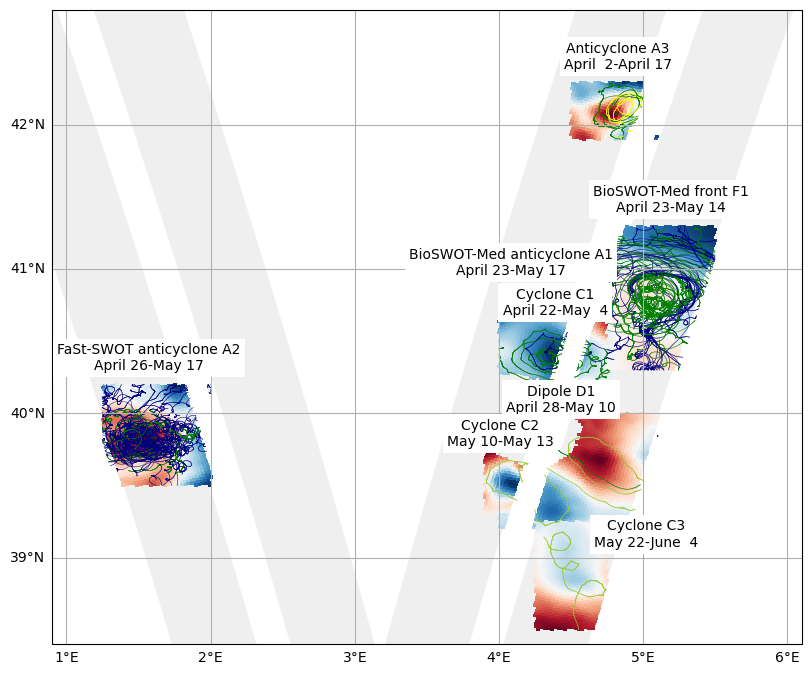

In [7]:
bbox = [0.9, 6.1, 38.4, 42.8]
kw = dict(transform=crs, cmap='RdBu_r', add_colorbar=False)
fig, ax = plt.subplots(1, 1, figsize=(8,8), frameon=False, subplot_kw=dict(projection=ccrs.PlateCarree()), layout='constrained')
plot_swot_tracks(ax, bbox)
#for id_ in ds.drifter_id :
    #ds_ = ds.sel(drifter_id = id_)
    #ax.plot(ds_.longitude, ds_.latitude, transform =crs, c='k', lw=0.5)

for k in structure :
    dlatext=0
    dlotext=0
    if k == 'BioSWOT-Med' : continue

    #elif 'BioSWOT-Med'in k : 
    #    dlotext, dlatex = -1, -0.5
    if 'A1' in k : dlotext, dlatext= -1, -0.35
    elif 'C3' in k : dlotext, dlatext = 0.5, -0.2
        
    #for id_ in DF[k].drifter_id.unique():
    #    df_ = DF[k][DF[k].drifter_id==id_].sort_index()
    #    ax.plot(df_.longitude, df_.latitude, transform =crs, c=df_.depthcolor.values[0], lw=1)
    DF[k].plot.scatter('longitude', 'latitude', transform=crs, c = DF[k].depthcolor, s=0.2, ax=ax, linewidths=0)
    ax.text(DF[k].longitude.mean()+dlotext, DF[k].latitude.max()+dlatext+0.08, k +"\n"+f"{DF[k].datetime.min().strftime('%B %e')}-{DF[k].datetime.max().strftime('%B %e')}" , va = 'bottom', ha='center', bbox=dict(facecolor="w", edgecolor="none", pad=3.0))
    im = DS[k].etaf.sel(cycle_number=DS[k].cycle_number.mean(), method='nearest').plot(x='longitude', y='latitude', ax=ax, **kw, zorder=0)

#ax.add_feature(cfeature.LAND,)
ax.set_extent(bbox)
gl = ax.gridlines(draw_labels=True,)
gl.top_labels = False
gl.right_labels = False
ax.set_title('')
ax.legend(h,l,loc= 'upper left', title = 'Drifters depth : ')

#dtmin = pd.to_datetime(dfr.datetime.min().values).strftime("%m-%d-%Y")
#dtmax = pd.to_datetime(dfr.datetime.max().values).strftime("%m-%d-%Y")
#ax.set_title(f'SWOT-2km {pd.to_datetime(dss3.time.mean().values).strftime("%m-%d-%Y")}\n Drifters from {dtmin} to {dtmax}')
#fig.tight_layout()


## One image per cycle

In [11]:
def plot_structure_per_cycle(cmin, lomin, lamin, cmax, lomax, lamax, pass_, drifter_id, row, col, figsize = (10,10), title=''):
    dfr, dfr_, dss, era, bbox = get_structure_datasets(cmin, lomin, lamin, cmax, lomax, lamax, pass_, drifter_id)
    #col = 4
    #row = (cmax-cmin+1)//4
    #if (cmax-cmin)%4==0 : n+=-1 
    #if (cmax-cmin+1)<col : col, row = (cmax-cmin+1), 1
    #elif (cmax-cmin+1)%col>0:
    #    print('ok')
    #    row+=1

    #ratio =(lomax-lomin)/(lamax-lamin)
    #fig, axs = plt.subplots(row, col, figsize=(5*col+1, row*4/ratio), frameon=False, subplot_kw=dict(projection=ccrs.PlateCarree()))
    fig, axs = plt.subplots(row, col, figsize=figsize, frameon=False, subplot_kw=dict(projection=ccrs.PlateCarree()), layout='constrained')
    axs = axs.flatten()
    
    kw = dict(transform=crs, cmap='RdBu_r', add_colorbar=False)
    i=0
    for c in dfr.cycle_number.unique() :
        etaf = dss.etaf.sel(cycle_number=slice(cmin, cmax))
        kw['vmin'], kw['vmax'] = etaf.min(), etaf.max()
        
        ax=axs[i]
        im = dss.etaf.sel(cycle_number=int(c)).plot(x='longitude', y='latitude', ax=ax, **kw, zorder=0)
        cs = dss.etaf.sel(cycle_number=int(c)).plot.contour(x='longitude', y='latitude', ax=ax, colors='grey', add_labels = False, levels=30, zorder=1)
        #ax.clabel(cs, cs.levels, fontsize=10)
        dfr_ = dfr[dfr.cycle_number==c]
        #if (title =='BioSWOT-Med anticyclone A1')|(title =='FaSt-SWOT anticyclone A2'):
        dfr__ = dfr[(dfr.cycle_number<=c+2)&(dfr.cycle_number>=c-2)]
        ax.scatter(dfr__.longitude, dfr__.latitude, s=0.1, transform=crs, c='k', alpha=0.5)
        #else : 
        #    ax.scatter(dfr.longitude, dfr.latitude, s=0.1, transform=crs, c='k', alpha=0.5)
        dfr_.plot.scatter( 'longitude', 'latitude',ax=ax, s=2, transform=crs, c=dfr_.depthcolor, zorder=3)
        
        Q = era.sel(time=dss.sel(cycle_number=int(c)).time.mean(), method='nearest').plot.quiver(x='longitude', y='latitude', u='u10', v='v10', ax=ax,scale=70,  transform =crs, color='magenta', add_guide=False)
        ax.quiverkey(Q, 0.07, 0.05, 10, 'ERA5 wd at 10m\n'+r'10 $m.s^{-1}$', coordinates='figure', labelpos='N')
    
        ax.set_title(f"Cycle = {int(c)}, {dfr_.datetime.mean().strftime('%B %e')}")
        i+=1
    
    for ax in axs :
        ax.set_extent(bbox)
        #ax.add_feature(cfeature.LAND,)
        gl = ax.gridlines(draw_labels=True,)
        gl.top_labels = False
        gl.right_labels = False

    fig.colorbar(im, ax=axs.ravel().tolist(), label = 'DSL [m]', shrink=0.8, location='bottom')
    fig.suptitle(title)
    #fig.savefig(os.path.join(images_dir,'article_med_dynamics', 'structure',f'overview_{k}.pdf'))
    #fig.tight_layout(rect=[0, 0, 0.75, 1])
    return fig, axs

In [ ]:
structure.keys()

/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_43181/500685825.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfr_['depthcolor'] = [depthcolor[d] for d in dfr_.depth]


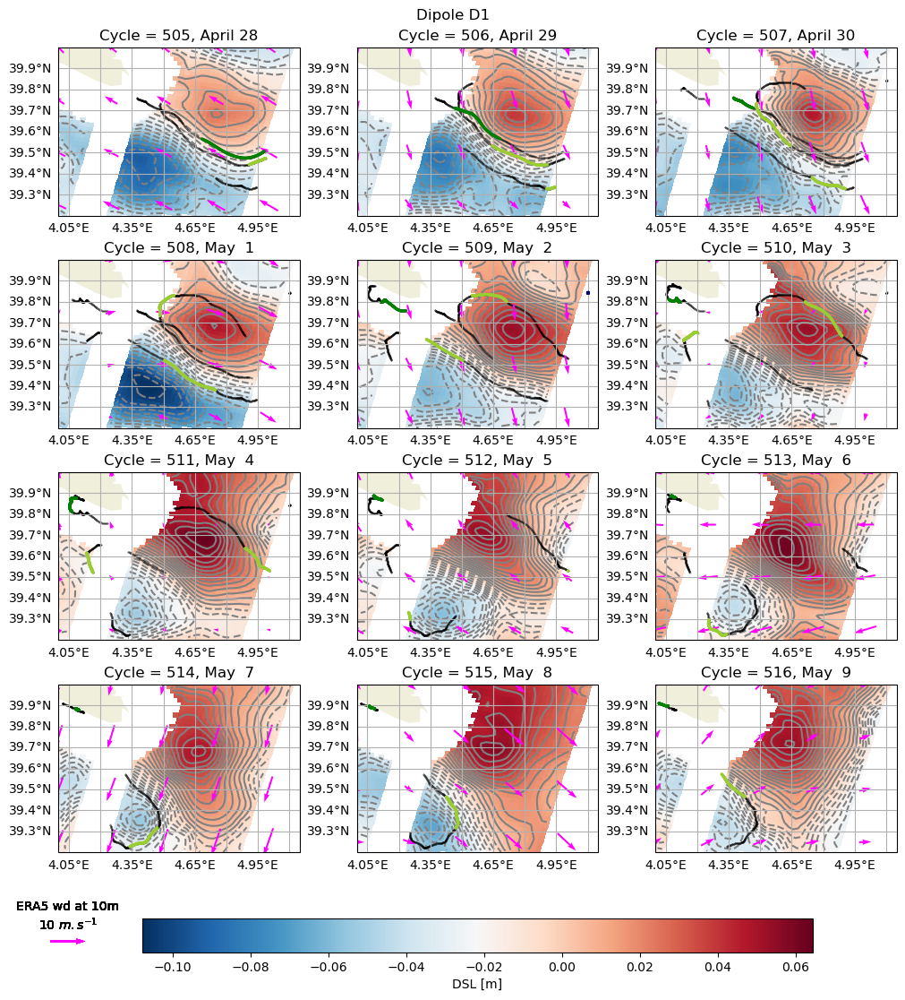

In [26]:
k = 'Dipole D1'
fig, axs = plot_structure_per_cycle(**structure[k], row=4, col=3, figsize = (10, 11), title = k)

/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_43181/500685825.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfr_['depthcolor'] = [depthcolor[d] for d in dfr_.depth]


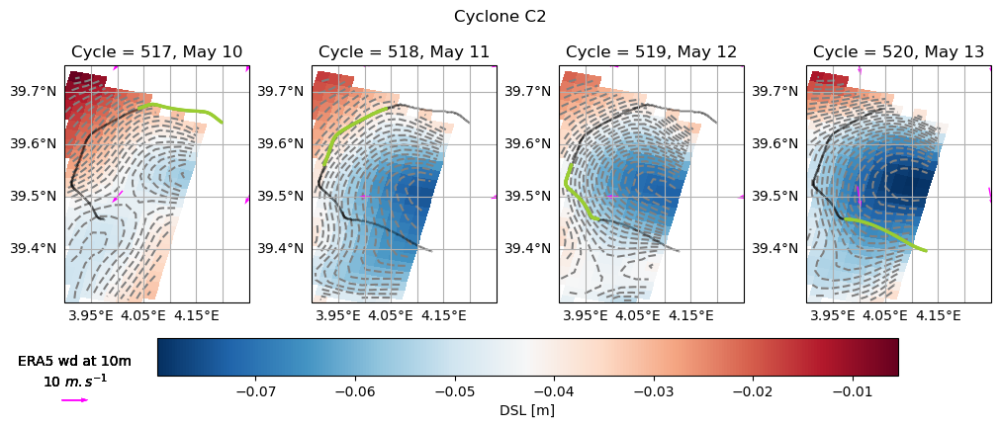

In [27]:
k = 'Cyclone C2'
fig, axs = plot_structure_per_cycle(**structure[k], row=1, col=4, figsize = (10, 4.2), title=k)

/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_43181/500685825.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfr_['depthcolor'] = [depthcolor[d] for d in dfr_.depth]


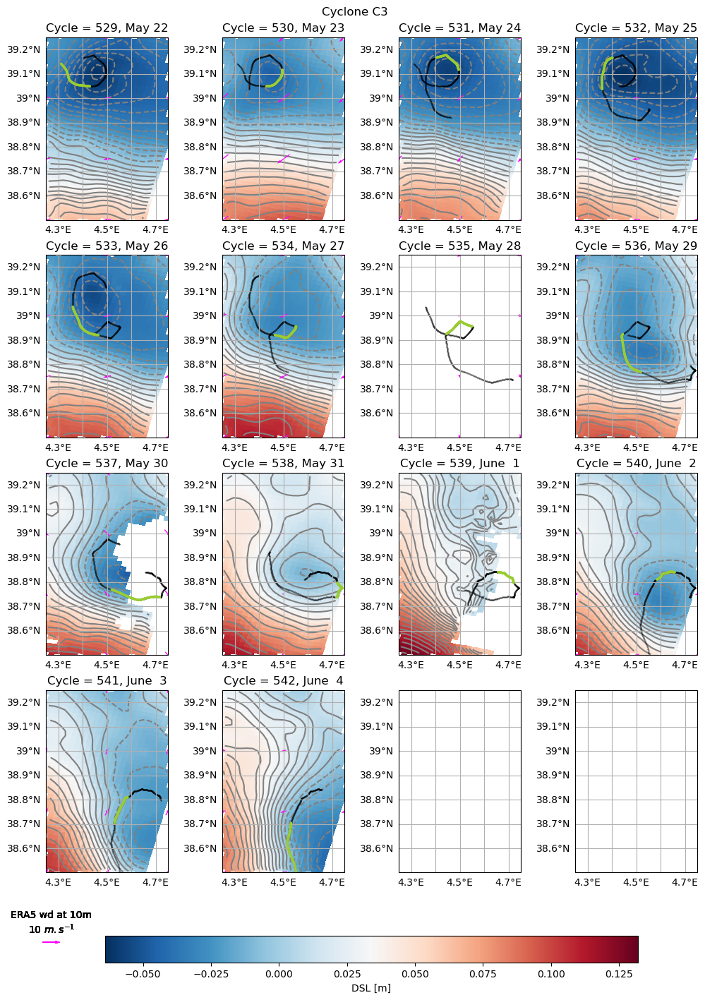

In [28]:
k = 'Cyclone C3'
fig, axs = plot_structure_per_cycle(**structure[k], row=4, col=4, figsize = (10, 14), title = k)

/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_43181/500685825.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfr_['depthcolor'] = [depthcolor[d] for d in dfr_.depth]


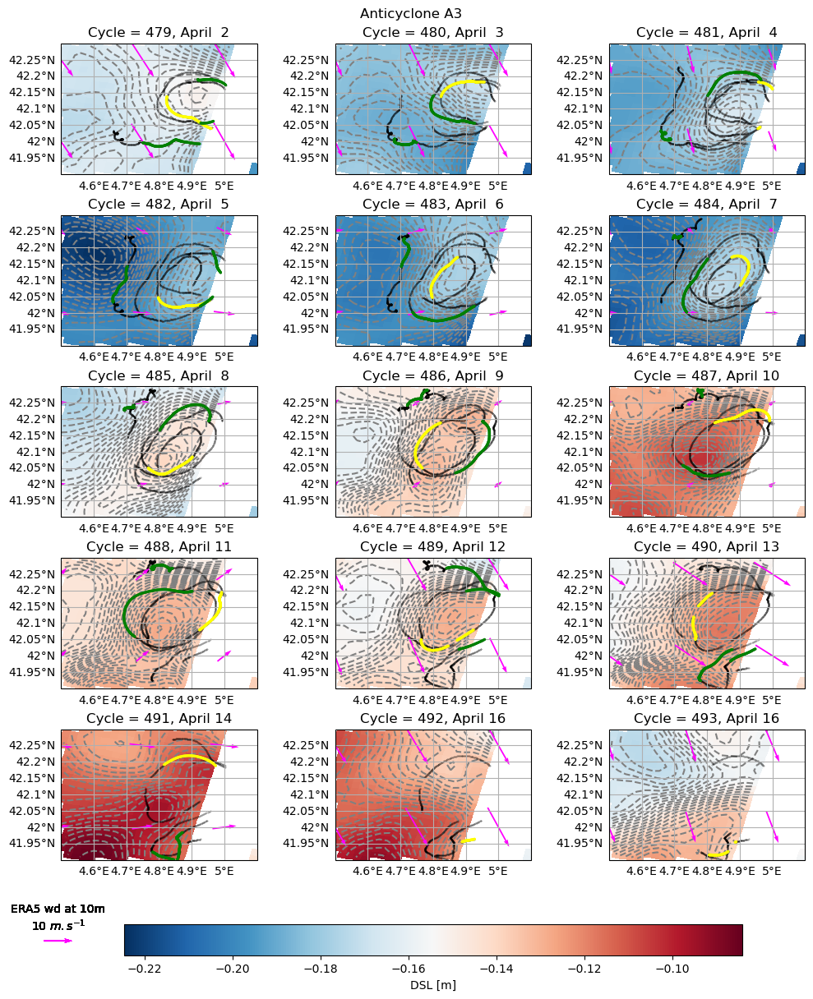

In [29]:
k = 'Anticyclone A3'
fig, axs = plot_structure_per_cycle(**structure[k], row=5, col=3, figsize = (10, 12), title=k)

/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_43181/500685825.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfr_['depthcolor'] = [depthcolor[d] for d in dfr_.depth]


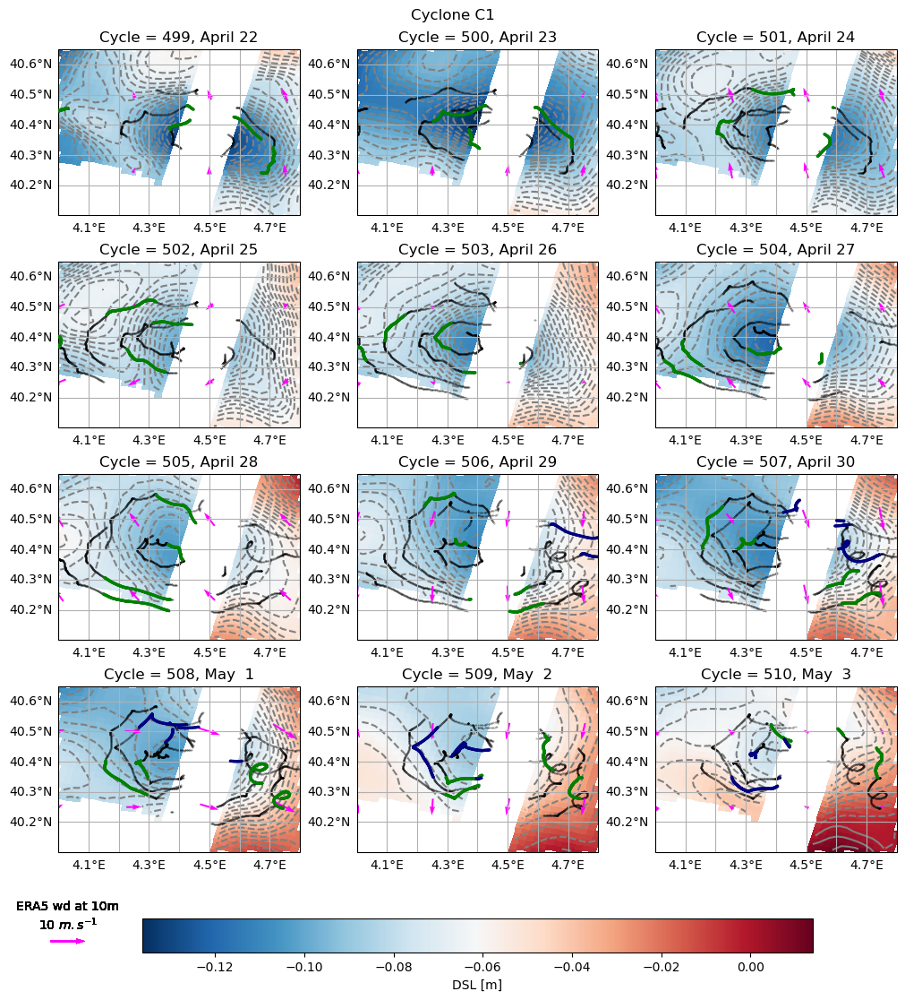

In [30]:
k = 'Cyclone C1'
fig, axs = plot_structure_per_cycle(**structure[k], row=4, col=3, figsize = (10, 11), title=k)

/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_43181/500685825.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfr_['depthcolor'] = [depthcolor[d] for d in dfr_.depth]


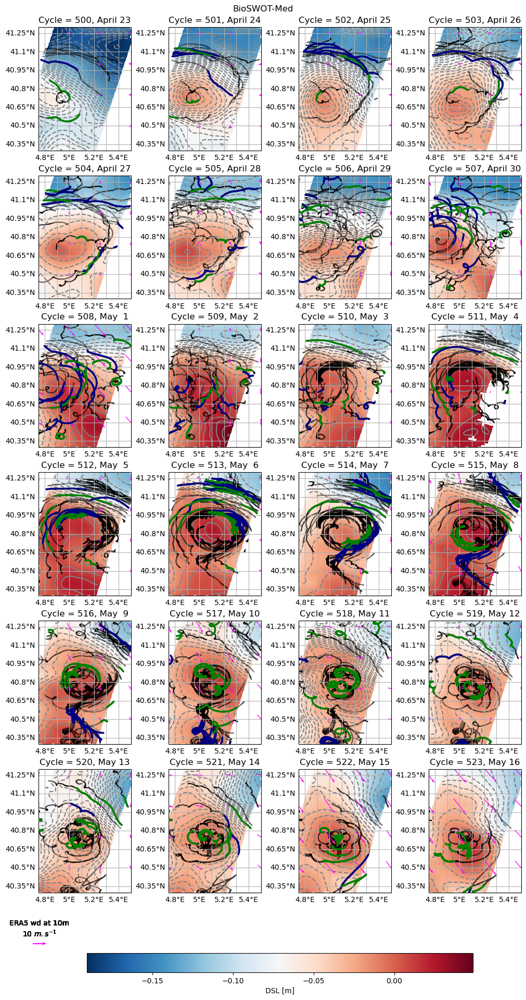

In [31]:
k = 'BioSWOT-Med'
fig, axs = plot_structure_per_cycle(**structure[k], row=6, col=4, figsize = (10, 19), title=k)

/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_43181/500685825.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfr_['depthcolor'] = [depthcolor[d] for d in dfr_.depth]


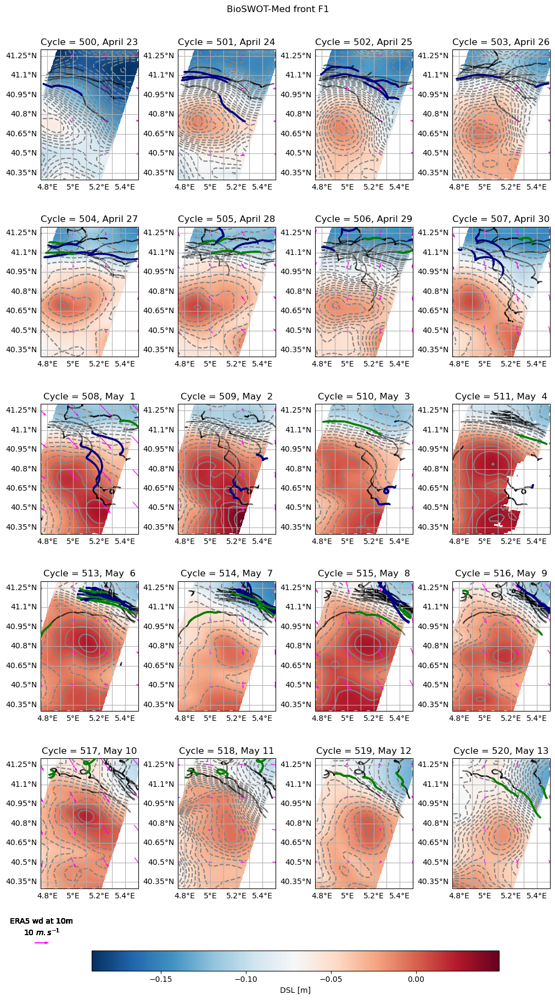

In [32]:
k = 'BioSWOT-Med front F1'
fig, axs = plot_structure_per_cycle(**structure[k], row=5, col=4, figsize = (10, 18), title=k)

/var/folders/fn/z858c2qj1lz65xr0z5mdvbf40000gp/T/ipykernel_43181/500685825.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfr_['depthcolor'] = [depthcolor[d] for d in dfr_.depth]


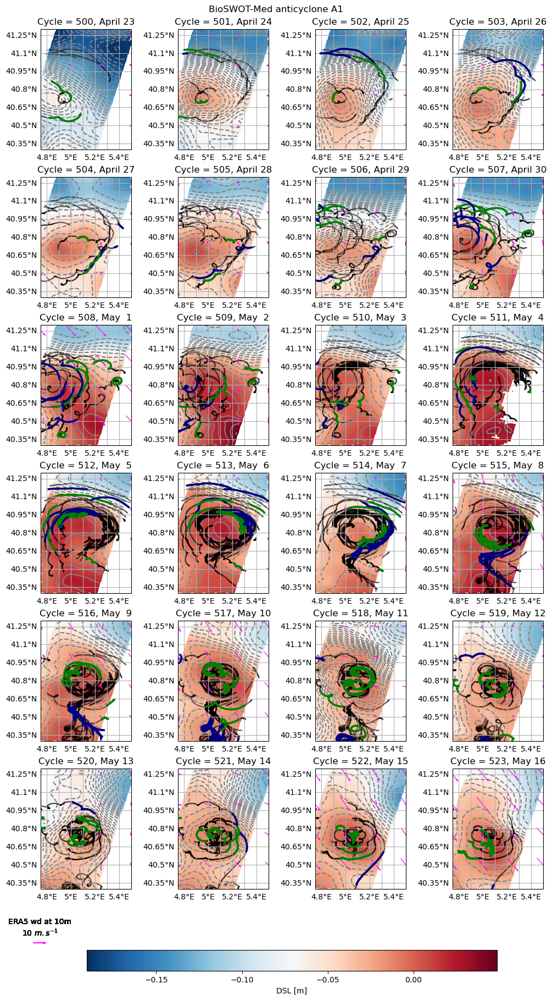

In [33]:
k = 'BioSWOT-Med anticyclone A1'
fig, axs = plot_structure_per_cycle(**structure[k], row=6, col=4, figsize = (10, 18), title=k)

/dev/shm/pbs.3769585.datarmor0/ipykernel_14843/500685825.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfr_['depthcolor'] = [depthcolor[d] for d in dfr_.depth]


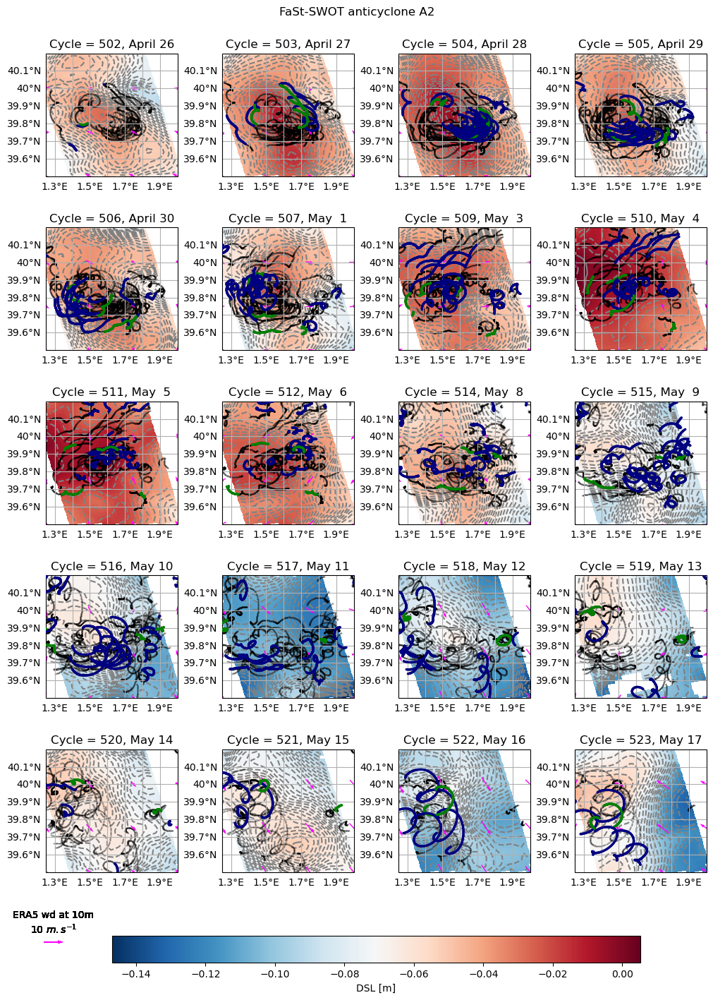

In [14]:
k = 'FaSt-SWOT anticyclone A2'
fig, axs = plot_structure_per_cycle(**structure[k], row=5, col=4, figsize = (10, 14), title=k)

In [15]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from pyproj import Geod

def scale_bar(ax, length, location=(0.5, 0.05), linewidth=3):
    """
    Ajoute une barre d’échelle en km sur une carte Cartopy.
    - ax : axes matplotlib/cartopy
    - length : longueur de la barre en km
    - location : position (x,y) en coordonnées axes [0,1]
    - linewidth : épaisseur de la barre
    """
    # Projection géodésique pour calculer les distances
    geod = Geod(ellps="WGS84")

    # Récupérer l’étendue actuelle de la carte
    x0, x1, y0, y1 = ax.get_extent(ccrs.PlateCarree())

    # Latitude au centre pour minimiser la distorsion
    lat = (y0 + y1) / 2

    # Point central de la barre
    lon_center = (x0 + x1) / 2
    lat_center = y0 + (y1 - y0) * location[1]

    # Conversion de km → degrés longitude
    lon1 = lon_center - length / (2 * 111) / np.cos(np.deg2rad(lat))
    lon2 = lon_center + length / (2 * 111) / np.cos(np.deg2rad(lat))

    # Tracer la barre
    ax.plot([lon1, lon2], [lat_center, lat_center],
            transform=ccrs.PlateCarree(), color='k', linewidth=linewidth)

    # Label
    ax.text(lon_center, lat_center - (y1-y0)*0.02,
            f"{length} km", ha='center', va='top',
            transform=ccrs.PlateCarree())


In [16]:
# Exemple d’utilisation
import numpy as np
fig = plt.figure(figsize=(8,6))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-5, 10, 35, 45])  # Exemple Méditerranée
ax.coastlines()
ax.add_feature(cfeature.BORDERS)

scale_bar(ax, length=200)  # Ajoute une barre de 200 km
plt.show()

/home1/datahome/mdemol/.miniconda3/envs/histenv/lib/python3.9/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


URLError: <urlopen error [Errno 101] Network is unreachable>

<Figure size 800x600 with 1 Axes>